In [1]:
#!pip install mayavi
#!jupyter nbextension install --py mayavi --user
#!jupyter nbextension enable --py mayavi --user

In [2]:
import utils.ps_utils as ps_utils
import os
from skimage.io import imshow
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
ps_utils

<module 'utils.ps_utils' from '/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py'>

In [4]:
filename = "shiny_vase.mat"
path = os.path.join("utils", filename)

# Reading shiny vase matlab file
# I - 3D array of image size (m,n,k) where k is views
# mask - with records of intensity data
# S - light vectors 
I, mask, S = ps_utils.read_data_file(path)

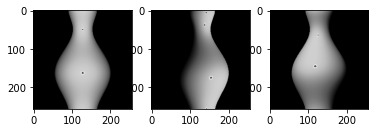

In [4]:
# show the 3 available images of beethoven
fig, axes = plt.subplots(1, 3)
ax = axes.ravel()

# images = data.stereo_motorcycle()
ax[0].imshow(I[:,:,0],cmap = 'Greys_r');
ax[1].imshow(I[:,:,1],cmap = 'Greys_r');
ax[2].imshow(I[:,:,2],cmap = 'Greys_r');

In [5]:
J = np.zeros((I.shape[2], len(mask[mask!=0]))) 

# Taking every img angle in I and saving pixels that are non-zero
for i in range(0, I.shape[2]):
    # Extract only pixels in the mask
    # Save as i in J
    J[i] = I[:,:,i][mask!=0]

In [6]:
# Obtain the albedo modulated normal field as M = S^−1J. 
S_inv = np.linalg.inv(S)
M = np.dot(S_inv, J)


In [7]:
# Normalizing albedo
albedo = np.linalg.norm(M, axis=0)

#norm = np.linalg.norm(M)
#normal_array = an_array/norm
#print(normal_array)

# All the values should be between 0 and 1
print(albedo)

[116.22583047 110.1976431  110.84795571 ... 184.84589005 198.97892681
 220.01052435]


In [8]:
# Finding albedo within the mask
albedo_mask = np.zeros(mask.shape)
albedo_mask[mask!=0] = albedo

In [9]:
# Then extract the normal field by normalizing M
# Extract its components n1, n2, n3. Solve for depth and display it at different view points.
# Comment on what happens here. 
normal = (1/ np.linalg.norm(M, axis=0))*M

c1, c2, c3 = normal

In [10]:
n1 = np.zeros(mask.shape)
n1[mask!=0] = c1

n2 = np.zeros(mask.shape)
n2[mask!=0] = c2

n3 = np.zeros(mask.shape)
n3[mask!=0] = c3

In [11]:
# help(utils.simchony_integrate)
# n1, n2, n3: nympy float arrays the 3 components of the normal. They must be 2D arrays
# Copying the mask
z = ps_utils.simchony_integrate(n1, n2, n3, mask)
z_unbiased = ps_utils.unbiased_integrate(n1, n2, n3, mask)

/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py:519: RuntimeWarning: invalid value encountered in true_divide
  p = -n2/n3
/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py:520: RuntimeWarning: invalid value encountered in true_divide
  q = -n1/n3
/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py:550: RuntimeWarning: divide by zero encountered in true_divide
  Z = fs/denum
/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py:597: RuntimeWarning: invalid value encountered in true_divide
  p = -n2/n3
/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py:598: RuntimeWarning: invalid value encountered in true_divide
  q = -n1/n3


In [12]:
# Inspecting the depth map at non-nan places
z[np.isnan(z)==False]
z

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [13]:
ps_utils.display_surface(z, albedo=None)

In [21]:
# ransac = np.ndarray((I.shape[2], mask.sum())) 
ransac = []
albedo = []
normal = []
# Per row in image
for i in range(0,I.shape[0]):
    # Per column in image
    for j in range(0, I.shape[1]):
        # If the position in the mask is non-zero
        # Apply RANSAC to the image pixel(s)
        if mask[i,j]!=0:
            m, inliers, best_fit = ps_utils.ransac_3dvector(data=(I[i,j,:], S), threshold = 1.0)
            p = np.linalg.norm(m)
            n = (1/ np.linalg.norm(m))*m
            
            albedo.append(p)
            ransac.append(m)
            normal.append(n)
            
normal = np.array(normal).reshape(3, 24828)           
ransac = np.array(ransac).reshape(3, 24828)
albedo = np.array(albedo)

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [   6.38564782 -105.65825651   48.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [   6.38564782 -105.65825651   48.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-15.81946256 -89.71769697  62.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-15.81946256 -89.71769697  62.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): e

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 46.69230272   5.91365199 173.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 51.38864394   7.50396162 172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 51.38864394   7.50396162 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 58.0448653    4.30565023 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 58.04486

ransac_3dvector(), updating best model to [-118.01967813   19.63979054  135.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-112.64230789   18.96463794  139.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-112.64230789   18.96463794  139.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-109.43013546   19.57214044  143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-109.43013546   19.57214044  143.        ]
ransac_3

ransac_3dvector(): estimated model [103.38695337   6.79680832 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [103.38695337   6.79680832 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 84.74491641  20.58509067 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 84.74491641  20.58509067 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 83.42446185  24.1121323  157.        ]
ransac_3dvector(): number of i

ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-47.13059948 -36.65871494  66.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-47.13059948 -36.65871494  66.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-65.84697123 -21.66765723  77.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.84697123 -21.66765723  77.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selecte

ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 41.27415994  37.86814881 171.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 41.27415994  37.86814881 171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 46.44929877  37.54722517 169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 46.44929877  37.54722517 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 63.45271152  29.8468

ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [124.72506559  43.05237582 121.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [124.72506559  43.05237582 121.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [130.53962998  41.46987278 116.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [130.53962998  41.46987278 116.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [135.35190945  40.8535

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 43.16896408  45.86288783 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 43.16896408  45.86288783 168.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 47.18119004  45.85846479 167.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 47.18119004  45.85846479 167.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-34.46699047  51.48173273 169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-34.46699047  51.48173273 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-29.9312772   52.42238849 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-29.9312772   52.42238849 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-82.45704862  12.54449523  76.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-82.45704862  12.54449523  76.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-97.36651209  24.02516397  85.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-97.36651209  24.02516397  85.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 52.77005048  56.40966792 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 52.77005048  56.40966792 162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 56.78227643  56.40524489 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 56.78227643  56.40524489 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-39.95721268  58.22373841 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-39.95721268  58.22373841 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-36.58441228  59.48089478 167.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-36.58441228  59.48089478 167.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-98.91222639  57.57579821 137.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-98.91222639  57.57579821 137.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-97.18113648  61.06068846 141.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-97.18113648  61.06068846 141.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-90.64085337  60.0690

ransac_3dvector(), updating best model to [168.82637551  25.31272856  77.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [189.24953373  -4.68942308  66.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [189.24953373  -4.68942308  66.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [210.63028714 -38.51404127  53.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [210.63028714 -38.51404127  53.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [ 46.59262673  57.69674605 163.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 51.28896796  59.28705568 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 51.28896796  59.28705568 162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 56.46410679  58.96613204 160.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 56.46410679  58.96613204 160.        ]
ransac_3dvector(): esti

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ -5.76854205  58.10847443 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -5.76854205  58.10847443 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ -0.75403118  57.13789691 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -0.75403118  57.13789691 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(), updating best model to [-64.64034887  55.45276858 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-59.10235068  55.42726985 160.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-59.10235068  55.42726985 160.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-53.56435249  55.40177113 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-53.56435249  55.40177113 162.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [-109.63198016   32.31194435   93.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-123.37853075   43.47611249  101.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-123.37853075   43.47611249  101.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-131.63177287   51.75846983  108.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-131.63177287   51.75846983  108.        ]
ransac_3

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 89.4748199   52.25196916 147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 89.4748199   52.25196916 147.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 94.81058668  52.58069939 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 94.81058668  52.58069939 143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ 39.52268376  50.02293067 168.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 46.86302039  48.41935194 166.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 46.86302039  48.41935194 166.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 49.39416382  51.29231666 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 49.39416382  51.29231666 165.        ]
ransac_3dvector(): esti

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-26.12745519  45.05180463 173.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-16.78254872  41.51591693 173.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-16.78254872  41.51591693 173.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-13.72791797  45.33396045 174.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-13.72791

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-236.45663532  217.74647646  162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [155.28662455 -11.20355379 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [155.28662455 -11.20355379 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 84.36167078  35.92933786 156.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 84.36

ransac_3dvector(): estimated model [  0.58372339  34.11098828 176.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  0.58372339  34.11098828 176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [  7.76343206  31.85775568 176.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  7.76343206  31.85775568 176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 11.98097568  35.35929858 176.        ]
ransac_3dvector(): number of i

ransac_3dvector(), updating best model to [ 37.69295561  29.24483161 173.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 42.38929684  30.83514124 172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 42.38929684  30.83514124 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 51.89483126  27.94890742 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 51.89483126  27.94890742 170.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [115.59660426  22.87397267 136.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [115.59660426  22.87397267 136.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [121.092999    23.85235677 130.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [121.092999    23.85235677 130.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ 75.50977564  14.19393039 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 76.03634923  18.99920407 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 76.03634923  18.99920407 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 82.37440094  18.36177982 158.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 82.37440094  18.36177982 158.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-122.6212983     1.20703342  122.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-122.6212983     1.20703342  122.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-125.86002954    8.51881326  129.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-125.86002954    8.51881326  129.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvecto

ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 21.04539878  -0.75524108 178.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 21.04539878  -0.75524108 178.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 25.2629424    2.74630183 178.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 25.2629424    2.74630183 178.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selecte

ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-25.64933917 -91.99096579  73.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-25.64933917 -91.99096579  73.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-48.17261919 -73.4895191   86.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-48.17261919 -73.4895191   86.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selecte

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-33.50218498 -13.6966469  176.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-33.50218498 -13.6966469  176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-26.80127391 -14.03864623 177.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-26.80127391 -14.03864623 177.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-64.61275232 -21.54281662 166.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-56.90955633 -22.85097043 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-56.90955633 -22.85097043 168.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-54.01555354 -19.68258078 171.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-54.01555

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-18.23294842 -28.74208561 176.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-18.23294842 -28.74208561 176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-13.69723515 -27.80142985 177.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-13.69723515 -27.80142985 177.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 11.85411682 -34.5655507  176.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 11.85411682 -34.5655507  176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 18.71565584 -34.25789615 175.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 18.71565584 -34.25789615 175.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 37.04260942 -41.62509646 171.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 37.04260942 -41.62509646 171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 41.73895065 -40.03478683 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 41.73895065 -40.03478683 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ 27.81055492 -44.15606185 171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 33.98797867 -45.44313998 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 33.98797867 -45.44313998 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 41.3283153  -47.04671871 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 41.3283153  -47.04671871 168.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [ 10.34873085 -50.18414712 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 16.5261546  -51.47122524 171.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 16.5261546  -51.47122524 171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 24.86877615 -54.04095846 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 24.86877615 -54.04095846 170.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-102.82952445  -58.6139905   133.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-102.82952445  -58.6139905   133.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-99.61735201 -58.006488   137.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-99.61735201 -58.006488   137.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): e

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -0.9803592  -60.35562258 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [  2.55306915 -58.44881234 169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  2.55306915 -58.44881234 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 10.8956907  -61.01854555 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 10.89569

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 30.59087483 -65.19628052 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 36.76829858 -66.48335865 163.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 36.76829858 -66.48335865 163.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 39.29944201 -63.61039393 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 39.29944

ransac_3dvector(): estimated model [ 39.57292194 -69.02759314 160.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 39.57292194 -69.02759314 160.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 45.75034569 -70.31467126 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 45.75034569 -70.31467126 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 50.92548452 -70.6355949  157.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [ 28.49383929 -72.83679059 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 28.49383929 -72.83679059 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 34.67126304 -74.12386871 160.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 34.67126304 -74.12386871 160.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 38.68348899 -74.12829174 159.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [ -1.16220433 -75.64106574 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -1.16220433 -75.64106574 162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [  3.85230654 -76.61164325 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  3.85230654 -76.61164325 162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [  7.38573489 -74.70483301 162.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [-44.62761917 -80.91307921 154.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-44.62761917 -80.91307921 154.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-40.77602118 -81.56715612 155.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-40.77602118 -81.56715612 155.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-36.24030791 -80.62650036 156.        ]
ransac_3dvector(): number of i

ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ -65.4954192  -105.88931474  120.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -65.4954192  -105.88931474  120.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-73.10923575 -98.8685368  124.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-73.10923575 -98.8685368  124.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-79.56013943 -9

ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [128.0883698  -84.51270319  93.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [128.0883698  -84.51270319  93.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [132.90064927 -85.12905175  87.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [132.90064927 -85.12905175  87.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [136.71064382 -84.7792

ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 39.86987441 -86.22426957 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 39.86987441 -86.22426957 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 45.04501324 -86.54519321 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 45.04501324 -86.54519321 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 49.05723919 -86.5496

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ -57.56343299 -115.47097983  117.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -57.56343299 -115.47097983  117.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ -62.53325415 -111.64409025  120.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -62.53325415 -111.64409025  120.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvecto

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [  4.35457668 -90.30235374 155.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  4.35457668 -90.30235374 155.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [  7.20388975 -89.99027617 155.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  7.20388975 -89.99027617 155.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [145.20193495 -89.75452978  53.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [145.20193495 -89.75452978  53.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [153.93706094 -96.08792551  40.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [153.93706094 -96.08792551  40.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [  64.14786621 -217.87637897   48.        ]
ransac_3dvector(): number o

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-20.64981543 -94.37263133 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-20.64981543 -94.37263133 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-20.44449776 -90.86666539 153.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-20.44449776 -90.86666539 153.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 65.01676356 -92.27993251 139.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 65.01676356 -92.27993251 139.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 69.50778712 -94.19558882 137.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 69.50778712 -94.19558882 137.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [  44.26858159 -202.56882065   60.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  44.26858159 -202.56882065   60.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [  34.64710892 -197.47592863   67.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  34.64710892 -197.47592863   67.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [  22.06347121 -186.62826111   74.        ]
ransac_3dvector

ransac_3dvector(): estimated model [118.80853932 -93.76017554  95.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [118.80853932 -93.76017554  95.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [121.97910831 -92.14879022  91.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [121.97910831 -92.14879022  91.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [125.6284749  -92.44863817  86.        ]
ransac_3dvector(): number of i

ransac_3dvector(), updating best model to [ -21.82017597 -149.94186834   99.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -29.43399252 -142.92109039  103.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -29.43399252 -142.92109039  103.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ -34.40381368 -139.09420081  106.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -34.40381368 -139.09420081  106.        ]
ransac_3

ransac_3dvector(), updating best model to [-59.09763313 -96.75502742 139.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-57.89003054 -94.21521596 141.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-57.89003054 -94.21521596 141.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-54.03843254 -94.86929287 142.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-54.03843254 -94.86929287 142.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [105.48992408 -95.08394253 109.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [105.48992408 -95.08394253 109.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [108.97866271 -96.03344436 106.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [108.97866271 -96.03344436 106.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-77.76088726 -97.60253436 128.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-77.76088726 -97.60253436 128.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-77.23739995 -96.65745557 130.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-77.23739995 -96.65745557 130.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ 10.48731071 -94.44574393 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 15.98061919 -97.32755472 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 15.98061919 -97.32755472 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 18.82993226 -97.01547715 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 18.82993226 -97.01547715 150.        ]
ransac_3dvector(): esti

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  7.63799764 -94.75782151 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 10.48731071 -94.44574393 151.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 10.48731071 -94.44574393 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 15.98061919 -97.32755472 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 15.98061

ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 75.48297946 -95.12843799 130.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 75.48297946 -95.12843799 130.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 79.97400302 -97.0440943  128.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 79.97400302 -97.0440943  128.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 82.98394405 -96.0823

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [  54.52639355 -212.78348696   55.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  54.52639355 -212.78348696   55.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [  43.42383836 -204.81320719   62.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  43.42383836 -204.81320719   62.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvecto

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [  58.01513218 -213.73298878   52.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  58.01513218 -213.73298878   52.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [  48.39365951 -208.64009677   59.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  48.39365951 -208.64009677   59.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvecto

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -27.95291    -145.79847815  103.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ -34.40381368 -139.09420081  106.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -34.40381368 -139.09420081  106.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ -39.37363483 -135.26731123  109.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model t

ransac_3dvector(): estimated model [-50.18683455 -95.52336977 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-50.18683455 -95.52336977 143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-46.33523655 -96.17744668 144.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-46.33523655 -96.17744668 144.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-44.64883635 -95.5488685  145.        ]
ransac_3dvector(): number of i

ransac_3dvector(), updating best model to [-62.94923113 -96.10095052 138.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-61.26283093 -95.47237233 139.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-61.26283093 -95.47237233 139.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-57.41123293 -96.12644924 140.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-57.41123293 -96.12644924 140.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [-46.81403415 -94.26621341 145.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-42.96243616 -94.92029031 146.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-42.96243616 -94.92029031 146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-41.27603596 -94.29171213 147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-41.27603596 -94.29171213 147.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ -7.08736534 -94.40697611 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -7.08736534 -94.40697611 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ -4.23805226 -94.09489854 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -4.23805226 -94.09489854 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-29.0371267  -94.65921018 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-29.0371267  -94.65921018 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-24.02261583 -95.62978769 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-24.02261583 -95.62978769 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [-52.35203234 -94.24071468 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-52.35203234 -94.24071468 143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-50.66563215 -93.6121365  144.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-50.66563215 -93.6121365  144.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-46.81403415 -94.26621341 145.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 34.23941051 -95.77158988 149.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 34.23941051 -95.77158988 149.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 33.44244327 -91.29946946 149.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 33.44244327 -91.29946946 149.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 70.6707     -94.51208943 136.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 70.6707     -94.51208943 136.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 72.51772815 -93.23385737 135.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 72.51772815 -93.23385737 135.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(), updating best model to [101.36175988 -92.8728613  115.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [104.37170092 -91.91112986 113.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [104.37170092 -91.91112986 113.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [107.86043955 -92.86063168 110.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [107.86043955 -92.86063168 110.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [130.96424169 -92.11990794  82.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [133.4506954  -92.10325529  78.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [133.4506954  -92.10325529  78.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [134.93486419 -91.12044815  73.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [134.93486419 -91.12044815  73.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [  76.41333428 -226.16315935   40.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [  61.50387081 -214.68249061   49.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  61.50387081 -214.68249061   49.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [  47.75732022 -203.51832247   57.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  47.75732022 -203.51832247   57.        ]
ransac_3

ransac_3dvector(), updating best model to [  -5.74779962 -161.73903769   89.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ -10.71762077 -157.91214811   92.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -10.71762077 -157.91214811   92.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -18.33143733 -150.89137017   96.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -18.33143733 -150.89137017   96.        ]
ransac_3

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -47.30562104 -125.68564614  112.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ -51.11252931 -122.17525717  114.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -51.11252931 -122.17525717  114.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -57.56343299 -115.47097983  117.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model t

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-75.43506151 -98.23553558 126.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-79.24196979 -94.72514661 128.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-79.24196979 -94.72514661 128.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-84.52996059 -88.33736988 130.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-84.52996

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-82.27538336 -83.90740083 136.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-76.94270284 -87.4388655  137.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-76.94270284 -87.4388655  137.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-75.73510024 -84.89905404 139.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-75.73510

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-72.36229985 -83.64189767 141.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-69.19481713 -85.89070724 142.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-69.19481713 -85.89070724 142.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-65.34321914 -86.54478415 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.34321

ransac_3dvector(): estimated model [-65.82201674 -84.63355087 144.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.82201674 -84.63355087 144.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-64.13561654 -84.00497269 145.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-64.13561654 -84.00497269 145.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-60.28401855 -84.65904959 146.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [-64.61441414 -82.09373941 146.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-64.61441414 -82.09373941 146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-60.76281615 -82.74781632 147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-60.76281615 -82.74781632 147.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-59.07641595 -82.11923813 148.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-65.09321174 -80.18250614 147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.09321174 -80.18250614 147.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-61.24161375 -80.83658305 148.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-61.24161375 -80.83658305 148.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ -64.33250632 -106.20581535  119.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -64.33250632 -106.20581535  119.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -68.1394146  -102.69542638  121.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -68.1394146  -102.69542638  121.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvecto

ransac_3dvector(): estimated model [  50.60971957 -199.34605001   52.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  50.60971957 -199.34605001   52.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [  39.50716438 -191.37577024   59.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  39.50716438 -191.37577024   59.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [  29.56752206 -183.72199107   65.        ]
ransac_3dvector

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [136.96065121 -78.41696782  84.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [139.44710492 -78.40031517  80.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [139.44710492 -78.40031517  80.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [143.09647151 -78.70016312  75.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [143.09647

ransac_3dvector(), updating best model to [105.39520302 -78.24149505 123.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [107.72102877 -78.87449627 121.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [107.72102877 -78.87449627 121.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [108.565772   -76.63010973 119.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [108.565772   -76.63010973 119.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 54.20890548 -75.09106267 153.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 54.20890548 -75.09106267 153.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 57.53701616 -76.69021837 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 57.53701616 -76.69021837 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 58.90524671 -73.50075304 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 58.90524671 -73.50075304 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 62.23335739 -75.09990873 151.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 62.23335739 -75.09990873 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [-14.99813436 -70.18952173 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-10.66773876 -72.75483191 164.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-10.66773876 -72.75483191 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ -7.81842569 -72.44275434 164.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -7.81842569 -72.44275434 164.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [-29.08407177 -71.10025574 162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-29.56286938 -69.18902247 163.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-29.56286938 -69.18902247 163.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-26.7135563  -68.87694489 163.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-26.7135563  -68.87694489 163.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [-50.1890899  -69.10810327 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-46.33749191 -69.76218017 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-46.33749191 -69.76218017 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-44.65109171 -69.13360199 160.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-44.65109171 -69.13360199 160.        ]
ransac_3dvector(): esti

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-69.9705672  -66.78279753 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-68.7629646  -64.24298607 153.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-68.7629646  -64.24298607 153.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-65.59548188 -66.49179565 154.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.59548

ransac_3dvector(): estimated model [ -46.57064351 -113.51421162  105.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -46.57064351 -113.51421162  105.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ -51.54046466 -109.68732204  108.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -51.54046466 -109.68732204  108.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ -53.86629042 -109.05432083  110.        ]
ransac_3dvector

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [116.04326405 -65.80455737 121.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [116.04326405 -65.80455737 121.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [119.53200268 -66.75405919 118.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [119.53200268 -66.75405919 118.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 85.07872424 -62.02658628 144.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 85.07872424 -62.02658628 144.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 88.40683491 -63.62574198 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 88.40683491 -63.62574198 143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ -8.84418315 -59.69712264 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -5.99487007 -59.38504506 169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -5.99487007 -59.38504506 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ -3.82967227 -60.66770015 169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -3.82967227 -60.66770015 169.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-69.03644453 -58.82578686 155.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-69.03644453 -58.82578686 155.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-67.35004434 -58.19720868 156.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-67.35004434 -58.19720868 156.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [ -17.06988621 -133.91466196   86.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -17.06988621 -133.91466196   86.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ -24.68370277 -126.89388402   90.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -24.68370277 -126.89388402   90.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -28.1724414  -125.94438219   93.        ]
ransac_3dvector

ransac_3dvector(), updating best model to [113.96744569 -58.80927815 127.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [114.81218892 -56.56489161 125.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [114.81218892 -56.56489161 125.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [117.13801467 -57.19789282 123.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [117.13801467 -57.19789282 123.        ]
ransac_3dvector(): esti

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 59.97652479 -53.11461127 160.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 59.97652479 -53.11461127 160.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 61.82355295 -51.83637921 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 61.82355295 -51.83637921 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ -6.06303233 -50.46187991 172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -6.06303233 -50.46187991 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ -3.89783453 -51.744535   172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -3.89783453 -51.744535   172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-69.10460679 -49.90262171 158.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-69.10460679 -49.90262171 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-67.41820659 -49.27404352 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-67.41820659 -49.27404352 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [-71.84768463 -81.89182859 114.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-71.84768463 -81.89182859 114.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-76.81750579 -78.06493901 117.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-76.81750579 -78.06493901 117.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-83.26840947 -71.36066168 120.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [154.77112092 -48.73339574  78.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [154.77112092 -48.73339574  78.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [158.42048751 -49.03324369  73.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [158.42048751 -49.03324369  73.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [159.9046563  -48.05043656  68.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [ 59.90836254 -44.19144612 163.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 59.90836254 -44.19144612 163.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 61.75539069 -42.91321406 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 61.75539069 -42.91321406 162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 65.08350137 -44.51236976 161.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-41.89341343 -48.11888204 169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-41.89341343 -48.11888204 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-30.15760522 -65.071131   169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-30.15760522 -65.071131   169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [-42.69038068 -43.64676162 169.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-35.07965039 -54.52773446 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-35.07965039 -54.52773446 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-18.90059461 -80.11214668 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-18.90059461 -80.11214668 170.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-57.57456046 -88.25072304 103.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-57.57456046 -88.25072304 103.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-62.54438161 -84.42383346 106.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-62.54438161 -84.42383346 106.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [121.85865935 -37.11159901 126.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [121.85865935 -37.11159901 126.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [125.34739798 -38.06110084 123.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [125.34739798 -38.06110084 123.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selecte

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 82.86658136 -37.18497675 156.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 82.86658136 -37.18497675 156.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 82.54841172 -34.6240896  155.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 82.54841172 -34.6240896  155.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 35.97216225 -31.73577683 173.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 35.97216225 -31.73577683 173.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 37.8191904  -30.45754477 172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 37.8191904  -30.45754477 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-30.83780331 -32.53020737 174.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-30.83780331 -32.53020737 174.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-30.63248564 -29.02424143 175.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-30.63248564 -29.02424143 175.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-37.48687189 -96.19212054  87.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-37.48687189 -96.19212054  87.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-43.61960592 -92.04873035  91.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-43.61960592 -92.04873035  91.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [135.10911234 -26.86466687 115.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [135.10911234 -26.86466687 115.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [138.59785097 -27.81416869 112.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [138.59785097 -27.81416869 112.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [  3.60396097 -22.42299846 178.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [  6.45327404 -22.11092088 178.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  6.45327404 -22.11092088 178.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [  7.13738932 -20.51618822 178.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  7.13738932 -20.51618822 178.        ]
ransac_3dvector(): esti

ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-39.61144648 -21.33273393 174.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-39.61144648 -21.33273393 174.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-36.76213341 -21.02065635 174.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-36.76213341 -21.02065635 174.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-35.07573321 -20.3920

ransac_3dvector(), updating best model to [-91.98148737 -20.11601526 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-92.93908257 -16.29354871 154.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-92.93908257 -16.29354871 154.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-89.08748458 -16.94762562 155.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-89.08748458 -16.94762562 155.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [  52.70488646 -152.90469848   26.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  52.70488646 -152.90469848   26.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [  33.14377148 -140.1580273    39.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  33.14377148 -140.1580273    39.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvecto

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [102.59224148 -15.14633776 146.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [102.59224148 -15.14633776 146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [107.08326503 -17.06199407 144.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [107.08326503 -17.06199407 144.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [ 19.10590492 -11.60629216 178.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 19.10590492 -11.60629216 178.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 19.7900202 -10.0115595 178.       ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 19.7900202 -10.0115595 178.       ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 25.28332867 -12.89337029 177.        ]
ransac_3dvector(): number of inliers

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-48.90857696 -11.08033927 172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-48.90857696 -11.08033927 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-48.70325929  -7.57437333 173.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-48.70325929  -7.57437333 173.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [-123.67444547   -8.40351395  128.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-123.62975575   -5.54720188  131.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-123.62975575   -5.54720188  131.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-120.94107064   -5.88477818  133.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-120.94107064   -5.88477818  133.        ]
ransac_3

ransac_3dvector(), updating best model to [139.62752561  -6.4241441  112.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [141.63518172  -4.49625817 109.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [141.63518172  -4.49625817 109.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [142.95872256  -4.16310491 106.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [142.95872256  -4.16310491 106.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [ 39.57767003  -4.61647545 175.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 3.87807028e+01 -1.44355028e-01  1.75000000e+02]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 3.87807028e+01 -1.44355028e-01  1.75000000e+02]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 44.27401126  -3.02616582 174.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 44.27401126  -3.02616582 174.        ]
ransa

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 27.22282253  -2.0423192  177.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 30.0721356   -1.73024163 177.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 30.0721356   -1.73024163 177.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 3.07562509e+01 -1.35508962e-01  1.77000000e+02]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-32.83845598   3.53775788 177.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-32.83845598   3.53775788 177.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-28.50806038   0.9724477  177.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-28.50806038   0.9724477  177.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimat

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -1.54633838 -96.07659142  51.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -1.54633838 -96.07659142  51.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-15.29288897 -84.91242329  59.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-15.29288897 -84.91242329  59.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(), updating best model to [120.95275731   7.56303079 131.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [125.92257847   3.7361412  128.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [125.92257847   3.7361412  128.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [126.7673217    5.98052774 126.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [126.7673217    5.98052774 126.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-16.22137513   7.32145661 178.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-16.22137513   7.32145661 178.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-21.98816354  15.62046661 181.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-21.98816354  15.62046661 181.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [-79.42049128  11.09125583 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-79.42049128  11.09125583 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-75.56889329  10.43717892 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-75.56889329  10.43717892 162.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-73.88249309  11.06575711 163.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-20.05430618 -73.71937287  58.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-20.05430618 -73.71937287  58.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-28.51286597 -68.94298147  64.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-28.51286597 -68.94298147  64.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 86.86542449  16.44612351 156.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 86.86542449  16.44612351 156.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 90.67233277  12.93573454 154.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 90.67233277  12.93573454 154.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 92.51936093  14.2139

ransac_3dvector(), updating best model to [ 31.58060784  17.74854969 176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 34.90871852  16.14939399 175.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 34.90871852  16.14939399 175.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 35.5928338   17.74412666 175.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 35.5928338   17.74412666 175.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [-69.93842939  19.98449923 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-68.25202919  20.61307741 166.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-68.25202919  20.61307741 166.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-64.4004312   19.95900051 167.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-64.4004312   19.95900051 167.        ]
ransac_3dvector(): esti

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-59.28630184 -38.29898254  79.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-68.06303128 -30.96170399  84.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-68.06303128 -30.96170399  84.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-74.19576531 -26.8183138   88.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-74.19576

ransac_3dvector(), updating best model to [128.07047627  21.95335312 124.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [128.9152195   24.19773966 122.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [128.9152195   24.19773966 122.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [132.40395813  23.24823783 119.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [132.40395813  23.24823783 119.        ]
ransac_3dvector(): esti

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 49.36368783  25.0759427  171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 54.85699631  22.19413191 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 54.85699631  22.19413191 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 61.03442006  20.90705379 169.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 61.03442

ransac_3dvector(), updating best model to [-45.36814517  28.82232215 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-41.03774957  26.25701197 172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-41.03774957  26.25701197 172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-39.35134937  26.88559016 173.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-39.35134937  26.88559016 173.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [-102.43144101   32.30892607  146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-97.09876049  28.77746141 147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-97.09876049  28.77746141 147.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-98.0563557   32.59992796 149.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-98.0563557   32.59992796 149.        ]
ransac_3dvector(): e

ransac_3dvector(), updating best model to [-53.26333351 -32.51532475  70.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-63.20297583 -24.86154559  76.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-63.20297583 -24.86154559  76.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-71.97970526 -17.52426704  81.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-71.97970526 -17.52426704  81.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 93.50434585  32.74767912 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 93.50434585  32.74767912 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 95.8301716  32.1146779 148.       ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 95.8301716  32.1146779 148.       ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated mod

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ -7.28010056  34.76948822 176.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -7.28010056  34.76948822 176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ -6.59598529  36.36422088 176.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -6.59598529  36.36422088 176.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-12.61278108  38.30095288 175.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-12.61278108  38.30095288 175.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ -8.28238548  35.7356427  175.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -8.28238548  35.7356427  175.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): estimated model [-101.74423947   37.76385363  141.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-101.74423947   37.76385363  141.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-100.53663687   40.30366509  143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-100.53663687   40.30366509  143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-100.01314955   41.24874388  145.        ]
ransac_3dvector

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [149.79183412  42.86467343  87.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [149.79183412  42.86467343  87.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [154.92228324  39.68743772  82.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [154.92228324  39.68743772  82.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ 99.25383425  43.94853612 143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [101.57966001  43.31553491 141.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [101.57966001  43.31553491 141.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [106.07068356  41.3998786  139.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [106.07068356  41.3998786  139.        ]
ransac_3dvector(): esti

ransac_3dvector(): estimated model [-29.50025558  43.79464826 171.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-29.50025558  43.79464826 171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-29.29493791  47.3006142  172.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-29.29493791  47.3006142  172.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-24.96454231  44.73530402 172.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-100.48886089   47.02017205  141.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-100.48886089   47.02017205  141.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-99.96537357  47.96525084 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-99.96537357  47.96525084 143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): e

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [138.20430879  45.02579669 105.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [140.2119649   46.95368262 102.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [140.2119649   46.95368262 102.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [141.53550574  47.28683588  99.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [141.53550

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [104.27143139  46.8381535  138.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [104.63737702  50.99377331 137.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [104.63737702  50.99377331 137.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [106.96320278  50.3607721  135.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [106.96320

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 69.61592154  51.91985537 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 70.77883442  51.60335476 157.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 70.77883442  51.60335476 157.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 72.62586257  52.88158682 156.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 72.62586

ransac_3dvector(): estimated model [ 35.19228817  52.58824085 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 35.19228817  52.58824085 168.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 38.52039884  50.98908515 167.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 38.52039884  50.98908515 167.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 39.20451412  52.58381782 167.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [ -1.91694406  57.45439752 171.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -1.91694406  57.45439752 171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [  2.41345154  54.88908734 171.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  2.41345154  54.88908734 171.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [  3.09756682  56.48382001 171.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [-82.57479801  59.05630637 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-82.57479801  59.05630637 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-79.40731529  56.8074968  151.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-79.40731529  56.8074968  151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-77.7209151   57.43607498 152.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-80.44939251  14.47238116  73.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-80.44939251  14.47238116  73.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-89.22612195  21.80965971  78.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-89.22612195  21.80965971  78.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [157.29279871  41.91074857  83.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [166.18238011  28.50661693  78.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [166.18238011  28.50661693  78.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [175.07196152  15.10248529  73.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [175.07196

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 98.02893166  60.90859167 137.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 98.02893166  60.90859167 137.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [102.51995521  58.99293536 135.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [102.51995521  58.99293536 135.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ 48.80560052  63.13059792 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 52.13371119  61.53144222 160.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 52.13371119  61.53144222 160.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 53.98073935  62.80967427 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 53.98073935  62.80967427 159.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [ -0.70625519  63.85440387 168.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [  2.14305788  64.16648145 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  2.14305788  64.16648145 168.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [  2.82717316  65.76121411 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  2.82717316  65.76121411 168.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [-35.37372342  65.88090113 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-32.52441034  66.19297871 164.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-32.52441034  66.19297871 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-30.83801015  66.82155689 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-30.83801015  66.82155689 165.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-127.63993318   67.39371891  108.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-127.63993318   67.39371891  108.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-127.59524347   70.25003098  111.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-127.59524347   70.25003098  111.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvecto

ransac_3dvector(), updating best model to [-78.23333246  23.76642792  66.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-87.01006189  31.10370647  71.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-87.01006189  31.10370647  71.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-94.3057088   35.56359727  76.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-94.3057088   35.56359727  76.        ]
ransac_3dvector(): esti

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 89.41283018  68.8955241  140.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 89.41283018  68.8955241  140.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 91.73865593  68.26252288 138.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 91.73865593  68.26252288 138.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [  2.66963147  68.97175513 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  2.66963147  68.97175513 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [  5.51894454  69.28383271 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  5.51894454  69.28383271 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [  8.36825762  69.5959

ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-11.68978587  73.47822034 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-11.68978587  73.47822034 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ -7.35939028  70.91291016 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -7.35939028  70.91291016 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ -6.675275    72.5076

ransac_3dvector(), updating best model to [-36.32823235  73.56356257 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-31.99783676  70.99825239 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-31.99783676  70.99825239 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-31.79251908  74.50421833 162.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-31.79251908  74.50421833 162.        ]
ransac_3dvector(): esti

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-123.9162318    65.89109559   90.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-130.04896583   70.03448578   94.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-130.04896583   70.03448578   94.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-133.33238679   74.48995354   98.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model t

ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [209.67269194 -34.69157472  55.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [209.67269194 -34.69157472  55.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [224.32906175 -56.39471637  47.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [224.32906175 -56.39471637  47.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selecte

ransac_3dvector(), updating best model to [ 71.60936392  77.2078032  146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 77.58147     72.41475913 144.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 77.58147     72.41475913 144.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 79.42849815  73.69299119 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 79.42849815  73.69299119 143.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [ 61.5772559   75.28876333 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 63.42428406  76.56699539 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 63.42428406  76.56699539 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 65.27131221  77.84522745 149.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 65.27131221  77.84522745 149.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [ 59.4120581   76.57141842 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 62.74016878  74.97226272 150.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 62.74016878  74.97226272 150.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 64.58719693  76.25049478 149.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 64.58719693  76.25049478 149.        ]
ransac_3dvector(): esti

ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 50.9088086   78.49149776 154.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 50.9088086   78.49149776 154.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 52.75583675  79.76972982 153.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 52.75583675  79.76972982 153.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 56.08394743  78.1705

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [  8.57666156  76.96207112 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  8.57666156  76.96207112 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 11.42597464  77.27414869 161.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 11.42597464  77.27414869 161.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [-30.58183022  80.90422468 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-30.58183022  80.90422468 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-26.25143462  78.3389145  159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-26.25143462  78.3389145  159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-23.40212155  78.65099208 159.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-32.26823042  80.2756465  158.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-32.26823042  80.2756465  158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-29.41891734  80.58772407 158.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-29.41891734  80.58772407 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-69.34781756  81.08271573 145.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-69.34781756  81.08271573 145.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-65.49621957  80.42863883 146.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.49621957  80.42863883 146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-80.26318599  81.78336705 139.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-80.26318599  81.78336705 139.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-79.05558339  84.32317851 141.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-79.05558339  84.32317851 141.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [-98.76581217  81.58551398 126.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-96.07712705  81.24793768 128.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-96.07712705  81.24793768 128.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-94.86952445  83.78774914 130.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-94.86952445  83.78774914 130.        ]
ransac_3dvector(): esti

ransac_3dvector(), updating best model to [ 255.07819417 -105.53469947   28.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-39.53903785  10.76102069  34.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-39.53903785  10.76102069  34.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-55.61141419  22.55819004  44.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-55.61141419  22.55819004  44.        ]
ransac_3dvector(): e

ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-66.29318681  84.90075925 146.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-66.29318681  84.90075925 146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-64.60678662  85.52933743 147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-64.60678662  85.52933743 147.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selecte

ransac_3dvector(), updating best model to [-126.37838206   84.37042711   98.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-122.68741203   83.06669633  101.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-122.68741203   83.06669633  101.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-121.64043739   84.95685392  105.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-121.64043739   84.95685392  105.        ]
ransac_3

ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-130.59283942   84.7290791    93.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-130.59283942   84.7290791    93.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-126.90186938   83.42534832   96.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-126.90186938   83.42534832   96.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-125.8548

ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-102.25146453   86.3952107   124.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-102.25146453   86.3952107   124.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-99.56277941  86.0576344  126.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-99.56277941  86.0576344  126.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-94.7088965   8

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-65.13027394  84.58425864 145.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.13027394  84.58425864 145.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-61.27867594  83.93018173 146.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-61.27867594  83.93018173 146.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-32.90456971  85.39742079 156.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-32.90456971  85.39742079 156.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-27.89005883  84.42684328 156.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-27.89005883  84.42684328 156.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-94.7088965   84.43740302 128.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-94.7088965   84.43740302 128.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-92.02021138  84.09982672 130.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-92.02021138  84.09982672 130.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [-57.90587555  85.1873381  148.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-57.90587555  85.1873381  148.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-56.21947535  85.81591629 149.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-56.21947535  85.81591629 149.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-52.36787736  85.16183938 150.        ]
ransac_3dvector(): number of i

ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ -8.78961055  84.36699977 158.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -8.78961055  84.36699977 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ -7.10321035  84.99557795 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -7.10321035  84.99557795 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ -4.25389727  85.3076

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [  4.29404195  86.24388825 159.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  4.29404195  86.24388825 159.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [  9.78735042  83.36207747 158.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [  9.78735042  83.36207747 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [ 41.24573248  84.5882726  153.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 41.24573248  84.5882726  153.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 44.57384316  82.98911691 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 44.57384316  82.98911691 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 45.94207371  86.17858224 152.        ]
ransac_3dvector(): number of i

ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 33.90539585  86.19185134 155.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 39.39870433  83.31004055 154.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 39.39870433  83.31004055 154.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 41.24573248  84.5882726  153.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 41.24573

ransac_3dvector(): estimated model [ 76.30879142  82.65830772 140.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 76.30879142  82.65830772 140.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 79.31873245  83.62003917 138.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 79.31873245  83.62003917 138.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 81.6445582   82.98703795 136.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 96.01014808  86.20096253 126.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 96.01014808  86.20096253 126.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [100.97996924  82.37407295 123.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [100.97996924  82.37407295 123.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [114.13795653  83.04818607 111.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [114.13795653  83.04818607 111.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [116.14561264  84.976072   108.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [116.14561264  84.976072   108.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-104.14671288   60.51058524   73.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-104.14671288   60.51058524   73.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-114.08635519   68.16436441   79.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-114.08635519   68.16436441   79.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvecto

ransac_3dvector(), updating best model to [-106.83186752   82.59824287  120.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-103.14089748   81.29451209  123.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-103.14089748   81.29451209  123.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-100.93100997   82.86816907  126.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-100.93100997   82.86816907  126.        ]
ransac_3

ransac_3dvector(): estimated model [-67.18261976  79.80006064 145.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-67.18261976  79.80006064 145.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-65.97501717  82.3398721  147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-65.97501717  82.3398721  147.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-62.12341917  81.6857952  148.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-57.74833386  81.97679708 151.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-57.74833386  81.97679708 151.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-53.89673587  81.32272018 152.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-53.89673587  81.32272018 152.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimat

ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 96.96465702  78.51830109 129.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 96.96465702  78.51830109 129.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [ 97.80940025  80.76268763 127.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 97.80940025  80.76268763 127.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
r

ransac_3dvector(), updating best model to [-124.85569609   80.48915653  106.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-120.16244113   78.21927127  110.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-120.16244113   78.21927127  110.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-115.78735582   78.51027316  113.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-115.78735582   78.51027316  113.        ]
ransac_3

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-70.1925608   78.83832919 147.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-70.1925608   78.83832919 147.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-64.85988028  75.30686453 148.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-64.85988028  75.30686453 148.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-43.18668511  77.11610292 157.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-43.18668511  77.11610292 157.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-39.33508712  76.46202602 158.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-39.33508712  76.46202602 158.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [ 74.25335932  74.01391483 145.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 79.42849815  73.69299119 143.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 79.42849815  73.69299119 143.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 82.43843918  74.65472264 141.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 82.43843918  74.65472264 141.        ]
ransac_3dvector(): esti

ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ 53.39217604  74.64795553 155.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 53.39217604  74.64795553 155.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 57.8831996   72.73229922 153.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 57.8831996   72.73229922 153.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ 61.89542555  72.7278

ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-127.40497043   66.84059742   93.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-127.40497043   66.84059742   93.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-134.01650207   72.89522088   98.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-134.01650207   72.89522088   98.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-129.8020

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-17.5937297   69.34809925 164.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-17.5937297   69.34809925 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [-17.38841202  72.85406519 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-17.38841202  72.85406519 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimat

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 12.69865322  67.0306001  165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 12.69865322  67.0306001  165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 14.06688377  70.22006544 165.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 14.06688377  70.22006544 165.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimat

ransac_3dvector(): estimated model [162.58078951  35.52297184  81.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [162.58078951  35.52297184  81.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [174.59316392  17.01371856  74.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [174.59316392  17.01371856  74.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [189.24953373  -4.68942308  66.        ]
ransac_3dvector(): number of i

ransac_3dvector(): estimated model [-39.90943669  64.94024537 163.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-39.90943669  64.94024537 163.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-37.53892122  67.16355622 164.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-37.53892122  67.16355622 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [-33.68732322  66.50947932 165.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 16.18430558  62.22090339 167.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 16.18430558  62.22090339 167.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [ 17.55253613  65.41036872 167.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 17.55253613  65.41036872 167.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [163.05958711  33.61173857  80.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [177.71595692  11.90859692  72.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [177.71595692  11.90859692  72.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [195.01632213 -12.98843308  63.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [195.01632213 -12.98843308  63.        ]
ransac_3dvector(): esti

ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [ -8.61785513  57.79639685 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -8.61785513  57.79639685 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [ -5.08442678  59.70320709 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ -5.08442678  59.70320709 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 2, 1]
ransac_3dvector(): estimated model [-6.99159032e-02  5.87

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [123.81833264  57.45154422 116.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [123.81833264  57.45154422 116.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [126.98890163  59.06292954 112.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [126.98890163  59.06292954 112.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [-110.39885812   50.61486378  131.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-106.50257041   52.81709894  135.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-106.50257041   52.81709894  135.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-104.2926829    54.39075591  138.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-104.2926829    54.39075591  138.        ]
ransac_3

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 43.53490971  50.01850764 167.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 43.53490971  50.01850764 167.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [ 47.54713567  50.01408461 166.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 47.54713567  50.01408461 166.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimat

ransac_3dvector(), updating best model to [-68.91890197  -5.98583374  72.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-83.82836544   5.49483501  81.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-83.82836544   5.49483501  81.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 2, 0]
ransac_3dvector(): estimated model [-94.93092063  13.46511478  88.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-94.93092063  13.46511478  88.        ]
ransac_3dvector(): esti

ransac_3dvector(): estimated model [-62.36538537  44.24306551 163.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-62.36538537  44.24306551 163.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [1, 0, 2]
ransac_3dvector(): estimated model [-56.34858958  42.30633351 164.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-56.34858958  42.30633351 164.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-54.45687171  46.44087764 166.        ]
ransac_3dvector(): number of i

ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-119.14368712   27.47778839  105.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-119.14368712   27.47778839  105.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 1, 0]
ransac_3dvector(): estimated model [-130.56441196   38.00895531  111.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [-130.56441196   38.00895531  111.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvecto

ransac_3dvector(): estimated model [ 45.2863859   37.86372578 170.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 45.2863859   37.86372578 170.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [0, 1, 2]
ransac_3dvector(): estimated model [ 56.95711812  33.69483687 168.        ]
ransac_3dvector(): number of inliers for this model 3
ransac_3dvector(), updating best model to [ 56.95711812  33.69483687 168.        ]
ransac_3dvector(): estimate of runs to select enough inliers with probability 0.9: 0.0030930429188895372
ransac_3dvector(): returning after 1 iterations.
ransac_3dvector(): at trial  0
ransac_3dvector(): selected indices =  [2, 0, 1]
ransac_3dvector(): estimated model [104.27330005   8.03731204 167.        ]
ransac_3dvector(): number of i

In [22]:
c1, c2, c3 = normal

n1 = np.zeros(mask.shape)
n1[mask!=0] = c1

n2 = np.zeros(mask.shape)
n2[mask!=0] = c2

n3 = np.zeros(mask.shape)
n3[mask!=0] = c3

In [23]:
# n1, n2, n3: nympy float arrays the 3 components of the normal. They must be 2D arrays
# Copying the mask
z = ps_utils.simchony_integrate(n1, n2, n3, mask)
# z_unbiased = utils.unbiased_integrate(n1, n2, n3, mask)

/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py:519: RuntimeWarning: invalid value encountered in true_divide
  p = -n2/n3
/Users/Marie/Desktop/ITC/VIP/vision-and-image-processing/DataAndCodeAssignment3/utils/ps_utils.py:520: RuntimeWarning: invalid value encountered in true_divide
  q = -n1/n3


In [24]:
z[np.isnan(z)==False]

array([28.0941434 , 27.87357212, 28.69679562, ...,  3.63834194,
        3.58554702,  4.62746392])

In [26]:
ps_utils.display_surface(z, albedo=None)

TypeError: display_surface() got multiple values for argument 'albedo'

In [19]:
# help(utils.smooth_normal_field)
smoothed_normals = ps_utils.smooth_normal_field(n1, n2, n3, mask, iters=1000)

n1_s , n2_s, n3_s = smoothed_normals

In [20]:
z = ps_utils.simchony_integrate(n1_s, n2_s, n3_s, mask)
ps_utils.display_surface(z, mask)